In [1]:
import cv2
import numpy as np
import pandas as pd
import random
import os

In [2]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
def preprocess(totalLabels,stats, centroids):
    columns = ['label_id', 'left','top','width','height','area','centroid_x','centroid_y']
    df = pd.DataFrame(columns=columns)
    df['label_id'] = [i for i in range(1,totalLabels+1)]
    df['left'] = stats[:,0]
    df['top'] = stats[:,1]
    df['width'] = stats[:,2]
    df['height'] = stats[:,3]
    df['area'] = stats[:,4]
    df['centroid_x'] = centroids[:,0]
    df['centroid_y'] = centroids[:,1]
    return df

In [5]:
def preprocess_helper(df, min_ar_thresh=2, max_ar_thresh=6, pixel_row_gap = 10):
    df['aspect_ratio'] = np.round(df['width']/df['height'],2)
    df = df[(df['aspect_ratio'] > min_ar_thresh) & (df['aspect_ratio'] < max_ar_thresh)]
    df = df.sort_values(by=['top', 'left']).reset_index(drop=True)
    
    df['rowID'] = 1
    row_id = 1
    prev_val = df.loc[0, 'top']
    for idx in range(1, df.shape[0]):
        curr_val = df.loc[idx, 'top']
        if curr_val - prev_val > pixel_row_gap:
            row_id += 1
        prev_val = curr_val
        df.at[idx, 'rowID'] = int(row_id)

    df['columnID'] = df.groupby('rowID')['left'].rank().astype(int)
    return df

In [6]:
def build_single_lexicon(label_id, df, k=5):
    if label_id not in df['label_id'].values:
        print("unknown component")
        return
    x,y,w,h,r,c = df[df['label_id'] == label_id][['centroid_x','centroid_y','width','height','rowID','columnID']].values[0]
    r1 = (df['rowID'] >= r-1)
    r2 = (df['rowID'] <= r+1)    
    temp_df = df[r1 & r2]
    temp_df = temp_df[temp_df['label_id'] != label_id]
    
    #rotation-invariance
    
    #scale-invariance
    temp_df['new_centroid_x'] = (temp_df['centroid_x']-x)/w
    temp_df['new_centroid_y'] = (y-temp_df['centroid_y'])/h
    temp_df['new_left'] = (temp_df['left']-x)/w
    temp_df['new_top'] = (y-temp_df['top'])/h
    temp_df['new_width'] = temp_df['width']/w
    temp_df['new_height'] = temp_df['height']/h
    
    #calculate distance & angle
    temp_df['Euclidean'] = np.sqrt(temp_df['new_centroid_y']**2 + temp_df['new_centroid_x']**2)
    temp_df['theta'] = np.degrees(np.arctan2(temp_df['new_centroid_y'], temp_df['new_centroid_x']))
    temp_df['theta'] = (temp_df['theta'] + 360) % 360 
    temp_df.loc[temp_df['theta'] > 350, 'theta'] = 0
    temp_df.loc[temp_df['theta'] < 2, 'theta'] = 0
    temp_df['quadrant'] = pd.cut(temp_df['theta'], 8, labels=range(1,9))
     
    res_df = temp_df.sort_values(by=['Euclidean','theta'])[:k]
    res_df = res_df.sort_values(by=['theta'])
    
    res_df['tl_corner'] = res_df.apply(lambda row: (row['new_left'], row['new_top']), axis=1)
    res_df['br_corner'] = res_df.apply(lambda row: (row['new_left']+row['new_width'], row['new_top']+row['new_height']), axis=1)           
    return res_df

In [7]:
def build_context_layout(img,k_neigh = 5):
    bs = 5
    k = -0.2
    maxval = 255
    img1 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgThresh = cv2.ximgproc.niBlackThreshold(img1,maxValue=maxval,
                                               type=cv2.THRESH_BINARY,blockSize=bs,k=k)
    
    totalLabels, labels, stats, centroid = cv2.connectedComponentsWithStats(imgThresh,4,cv2.CV_32S)
    df = preprocess(totalLabels,stats, centroid)
    df = preprocess_helper(df)
    #print("total no of words(>3 chars) identified:",df.shape[0])
    
    context_vectors = []
    for label in df.label_id.values:
        try:
            res = build_single_lexicon(label, df,k=k_neigh)
            if(res.shape[0] >= k_neigh):
                context_vectors.append(res[['tl_corner','br_corner']].values)
        except Exception as e:
            print()
            
    flattened_tuples = [np.array([item for sublist in t for item in sublist]) for t in context_vectors]
    array_of_tuples = np.array(flattened_tuples)
    context_vectors = array_of_tuples.reshape(len(context_vectors), k_neigh, 4)
    context_vectors = context_vectors.round(4)
    #print("total no of contexts extracted:",context_vectors.shape[0])
    
    return context_vectors

In [8]:
def feature_distance(a,b):
    m,n = a.shape[0],b.shape[0]
    if(m > n):
        c = b
        b = a
        a = c
        m,n = a.shape[0],b.shape[0]
    distances = np.zeros(m)
    for i in range(m):
        dist = np.linalg.norm(b - a[i, np.newaxis, :, :], axis=(1, 2))
        closest_index = np.argmin(dist)
        distances[i] = dist[closest_index]
    distances = np.round(distances,2)
    total_distance = np.round(np.sum(distances),2)
    return distances,total_distance

In [9]:
def random_hash():
    random_bits = random.getrandbits(128)
    r_hash = "%032x" % random_bits
    return r_hash

In [10]:
class DocumentDetails():
    def __init__(self, img,id,feature_vectors):
        self.img = img
        self.id = id
        self.feature_vectors = feature_vectors 

In [11]:
class DocumentVectors():
    def __init__(self, img_folder_path):
        
        img_files = [file for file in os.listdir(img_folder_path) if file.endswith('.png')]
        img_file_paths = [os.path.join(img_folder_path, file_name) for file_name in img_files]
        
        #initialize variables
        self.img_file_paths = img_file_paths
        self.context_vectors = {}
        
    def build_context_vector_DB(self):
        for id,img_path in enumerate(self.img_file_paths):
            img = cv2.imread(img_path)
            feature_vectors = build_context_layout(img)
            print(img_path, img.shape,id, feature_vectors.shape)
            
            h = random_hash()
            self.context_vectors[h] = DocumentDetails(img,id,feature_vectors)
    
    def show_docs(self):
        for key in self.context_vectors.keys():
            doc = self.context_vectors[key]
            plt.figure(figsize=(6, 4))
            plt.imshow(doc.img)
            plt.title("ID:"+str(doc.id))
            plt.show()
            

    def query(self,query_img):
        query_vectors = build_context_layout(query_img)
        print("found",len(query_vectors),"query vectors")
        
        min_score = 10000000
        result_doc = None
        
        for key in self.context_vectors.keys():
            doc = self.context_vectors[key]
            doc_vectors = doc.feature_vectors
            doc_id = doc.id
            _, score = feature_distance(doc_vectors,query_vectors)
            
            if score < min_score:
                min_score = score
                result_doc = img, doc_id, score
                
            print("doc_id:",doc_id,"score:",score)
            print("====================================")
            
        return result_doc

In [12]:
docs_path = './../../data/docs/'
dv = DocumentVectors(docs_path)
dv.build_context_vector_DB()

./../../data/docs/8.png (1664, 1238, 3) 0 (443, 5, 4)
./../../data/docs/9.png (1658, 1262, 3) 1 (429, 5, 4)
./../../data/docs/10.png (1770, 1270, 3) 2 (256, 5, 4)
./../../data/docs/4.png (1698, 1192, 3) 3 (193, 5, 4)
./../../data/docs/5.png (1710, 1296, 3) 4 (524, 5, 4)
./../../data/docs/7.png (1630, 1178, 3) 5 (176, 5, 4)
./../../data/docs/6.png (1726, 1306, 3) 6 (450, 5, 4)
./../../data/docs/2.png (1694, 1318, 3) 7 (513, 5, 4)
./../../data/docs/3.png (1704, 1300, 3) 8 (512, 5, 4)
./../../data/docs/1.png (1676, 1264, 3) 9 (407, 5, 4)


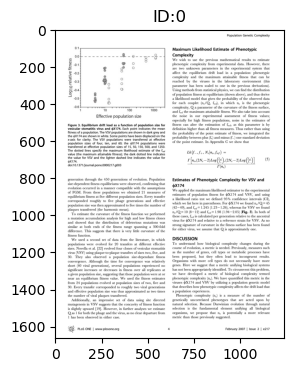

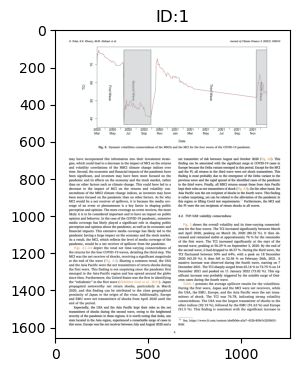

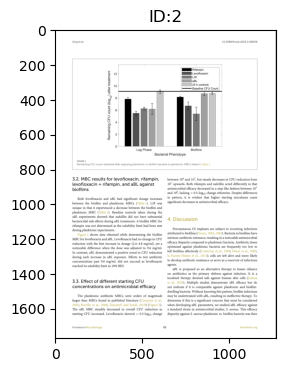

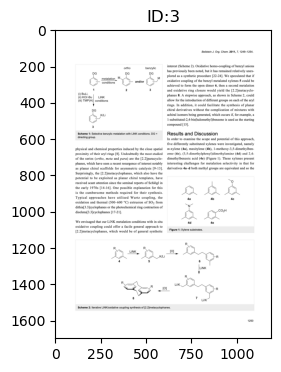

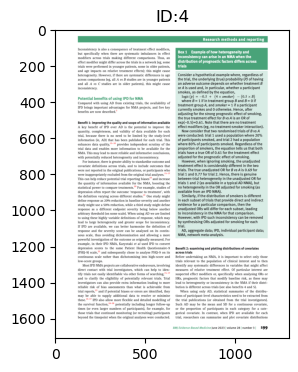

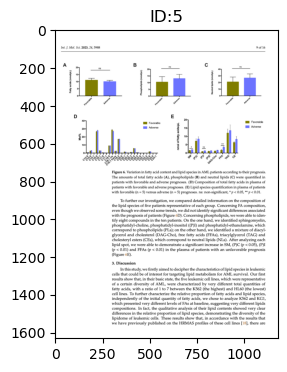

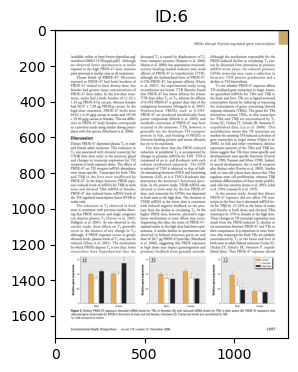

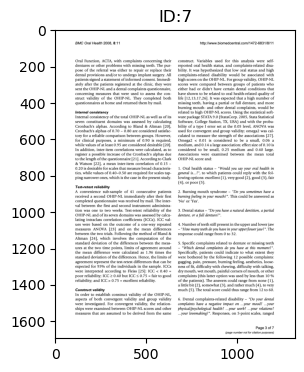

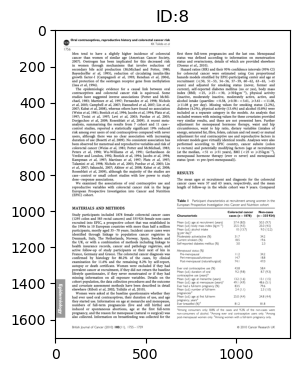

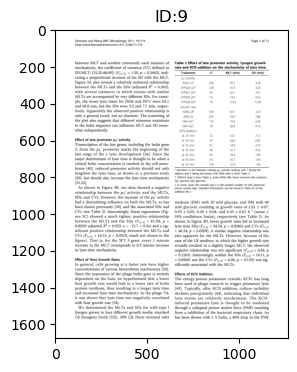

In [13]:
dv.show_docs()

## random crop(25%)

In [14]:
def random_quarter_crop(img):
    img_width, img_height,_ = img.shape
    max_left = img_width - img_width // 2
    max_top = img_height - img_height // 2
    left = random.randint(0, max_left)
    top = random.randint(0, max_top)
    crop_width = img_width // 2
    crop_height = img_height // 2
    cropped_img = img[left:left + crop_width, top:top + crop_height]
    return cropped_img

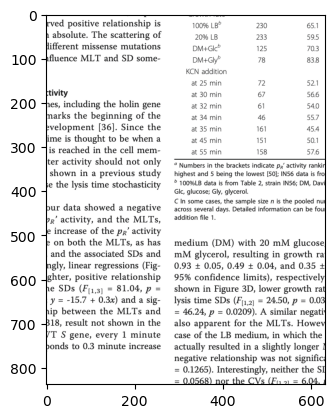

In [15]:
img_path = docs_path + str(1) + '.png'
img = cv2.imread(img_path)
img_c = random_quarter_crop(img)
plt.imshow(img_c)

In [16]:
res = dv.query(img_c)

found 131 query vectors
doc_id: 0 score: 731.87
doc_id: 1 score: 692.9
doc_id: 2 score: 692.52
doc_id: 3 score: 742.47
doc_id: 4 score: 735.04
doc_id: 5 score: 730.87
doc_id: 6 score: 685.32
doc_id: 7 score: 748.82
doc_id: 8 score: 713.83
doc_id: 9 score: 599.81


(9, 599.81)

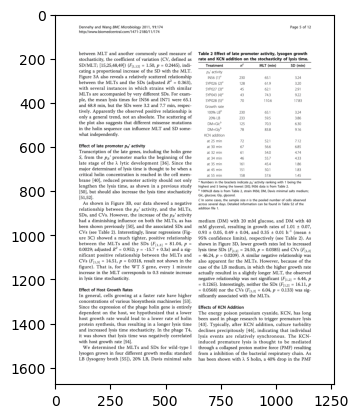

In [17]:
img, doc_id, score = res
plt.imshow(img)
doc_id, score

In [18]:
def plot_res(query,img_retr,doc_id):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(query)
    plt.title('query')
    plt.subplot(1, 2, 2)
    plt.imshow(img_retr)
    plt.title('retreived:'+str(doc_id))
    plt.show()

### scaled

found 146 query vectors
doc_id: 0 score: 291.59
doc_id: 1 score: 294.15
doc_id: 2 score: 306.53
doc_id: 3 score: 311.1
doc_id: 4 score: 286.25
doc_id: 5 score: 343.5
doc_id: 6 score: 301.12
doc_id: 7 score: 292.37
doc_id: 8 score: 301.17
doc_id: 9 score: 122.68


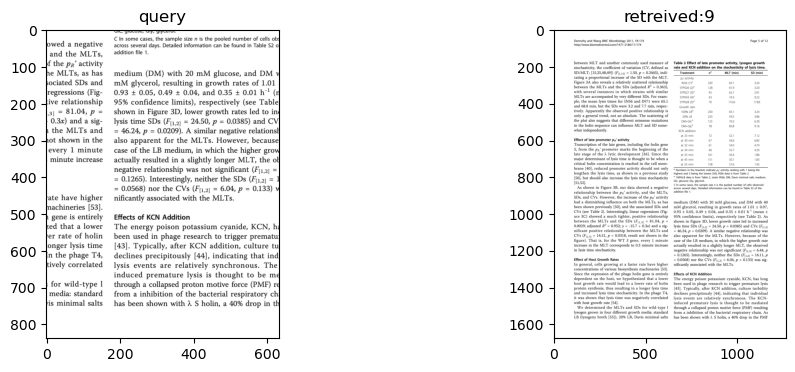

found 170 query vectors
doc_id: 0 score: 431.81
doc_id: 1 score: 429.27
doc_id: 2 score: 458.83
doc_id: 3 score: 465.37
doc_id: 4 score: 425.48
doc_id: 5 score: 500.73
doc_id: 6 score: 435.28
doc_id: 7 score: 206.56
doc_id: 8 score: 441.31
doc_id: 9 score: 425.09


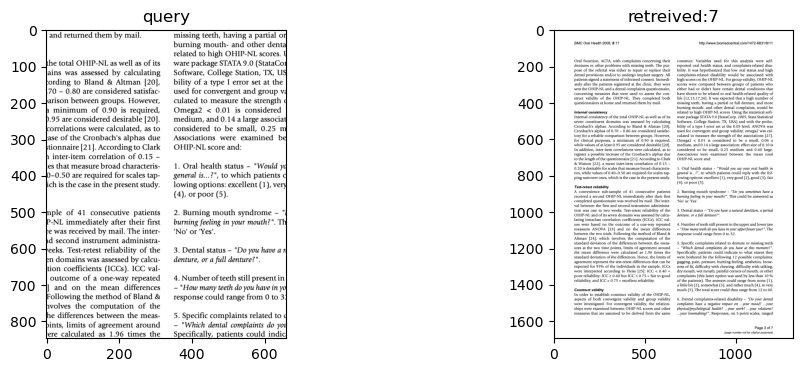

found 176 query vectors
doc_id: 0 score: 429.96
doc_id: 1 score: 434.36
doc_id: 2 score: 464.99
doc_id: 3 score: 480.76
doc_id: 4 score: 403.66
doc_id: 5 score: 2603.47
doc_id: 6 score: 415.58
doc_id: 7 score: 419.66
doc_id: 8 score: 192.83
doc_id: 9 score: 422.21


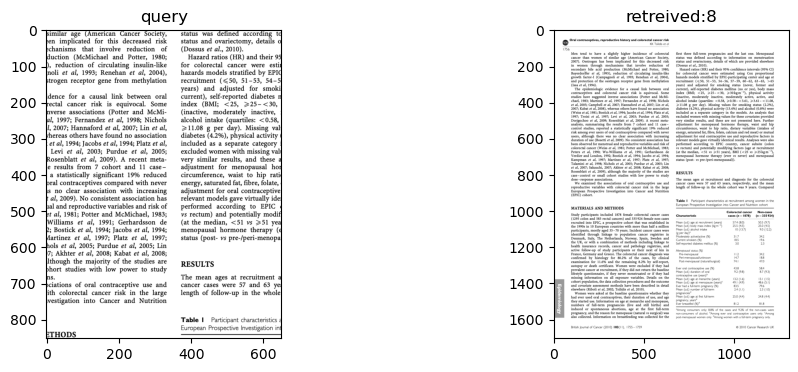

found 89 query vectors
doc_id: 0 score: 479.52
doc_id: 1 score: 483.96
doc_id: 2 score: 468.99
doc_id: 3 score: 249.3
doc_id: 4 score: 508.35
doc_id: 5 score: 526.49
doc_id: 6 score: 470.77
doc_id: 7 score: 504.12
doc_id: 8 score: 485.92
doc_id: 9 score: 503.12


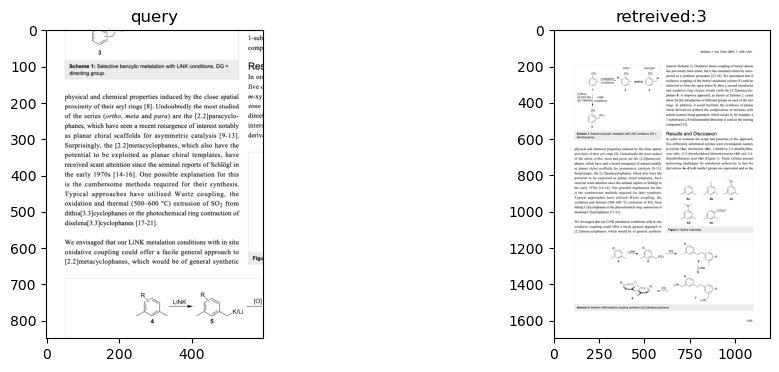

found 189 query vectors
doc_id: 0 score: 408.0
doc_id: 1 score: 406.05
doc_id: 2 score: 436.92
doc_id: 3 score: 445.2
doc_id: 4 score: 213.57
doc_id: 5 score: 2616.86
doc_id: 6 score: 422.84
doc_id: 7 score: 399.2
doc_id: 8 score: 417.48
doc_id: 9 score: 402.37


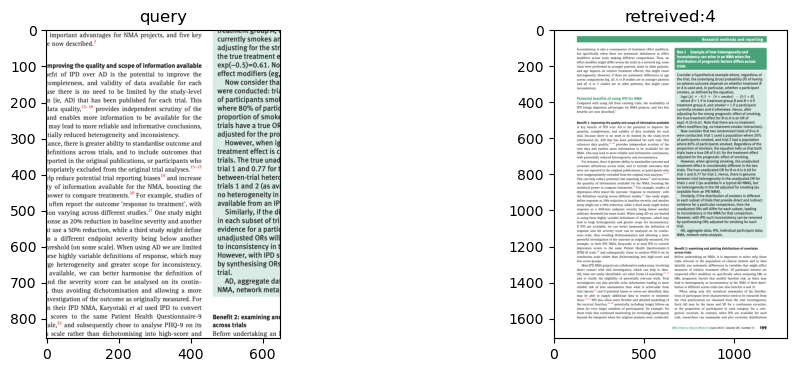

found 175 query vectors
doc_id: 0 score: 446.9
doc_id: 1 score: 471.5
doc_id: 2 score: 505.65
doc_id: 3 score: 515.02
doc_id: 4 score: 438.29
doc_id: 5 score: 519.48
doc_id: 6 score: 292.97
doc_id: 7 score: 458.41
doc_id: 8 score: 446.4
doc_id: 9 score: 455.55


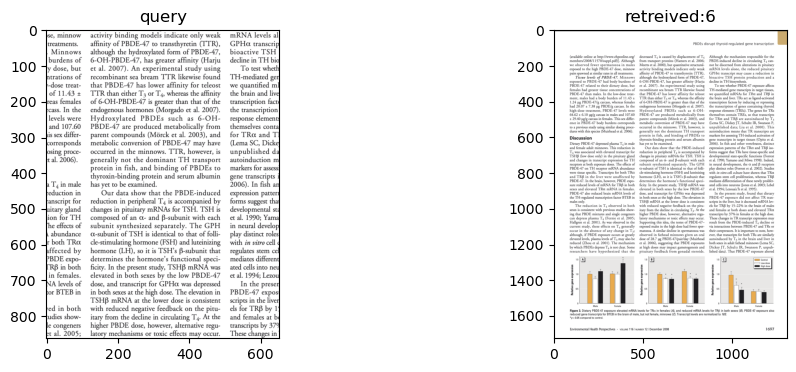

found 33 query vectors
doc_id: 0 score: 252.85
doc_id: 1 score: 273.57
doc_id: 2 score: 273.27
doc_id: 3 score: 266.32
doc_id: 4 score: 272.32
doc_id: 5 score: 231.11
doc_id: 6 score: 258.34
doc_id: 7 score: 281.72
doc_id: 8 score: 261.87
doc_id: 9 score: 261.53


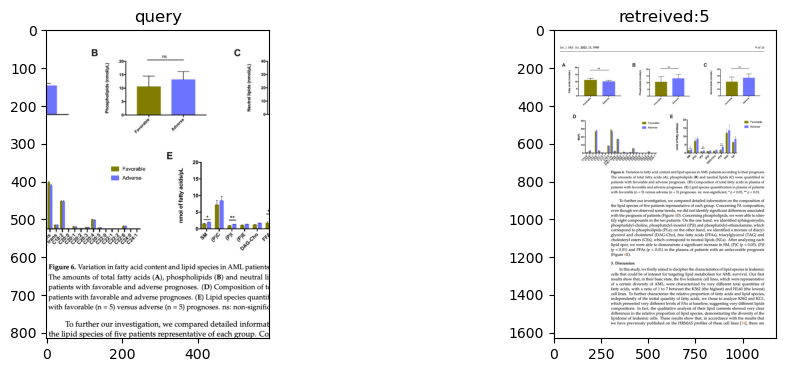

found 153 query vectors
doc_id: 0 score: 1038.16
doc_id: 1 score: 1146.35
doc_id: 2 score: 1150.72
doc_id: 3 score: 1191.85
doc_id: 4 score: 1160.72
doc_id: 5 score: 1113.8
doc_id: 6 score: 1126.75
doc_id: 7 score: 1172.34
doc_id: 8 score: 1113.34
doc_id: 9 score: 1161.06


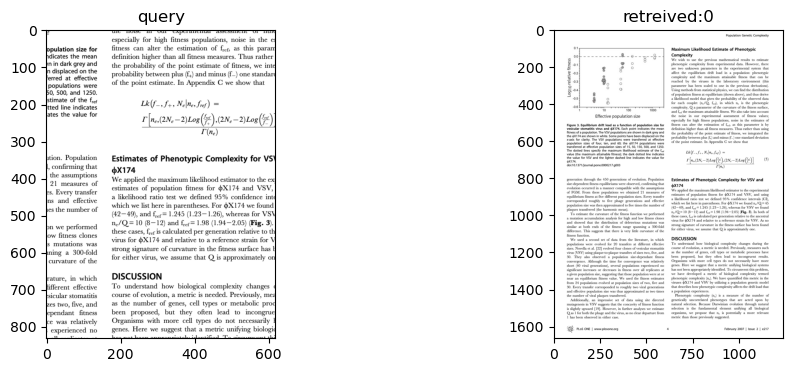

found 70 query vectors
doc_id: 0 score: 237.83
doc_id: 1 score: 125.84
doc_id: 2 score: 224.82
doc_id: 3 score: 241.51
doc_id: 4 score: 241.56
doc_id: 5 score: 261.98
doc_id: 6 score: 251.54
doc_id: 7 score: 240.59
doc_id: 8 score: 233.19
doc_id: 9 score: 246.74


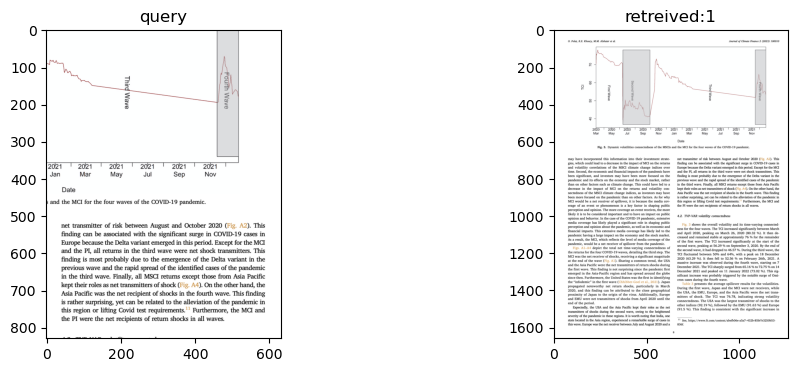

found 123 query vectors
doc_id: 0 score: 682.5
doc_id: 1 score: 708.01
doc_id: 2 score: 561.42
doc_id: 3 score: 713.68
doc_id: 4 score: 707.23
doc_id: 5 score: 734.02
doc_id: 6 score: 600.45
doc_id: 7 score: 689.93
doc_id: 8 score: 640.6
doc_id: 9 score: 711.8


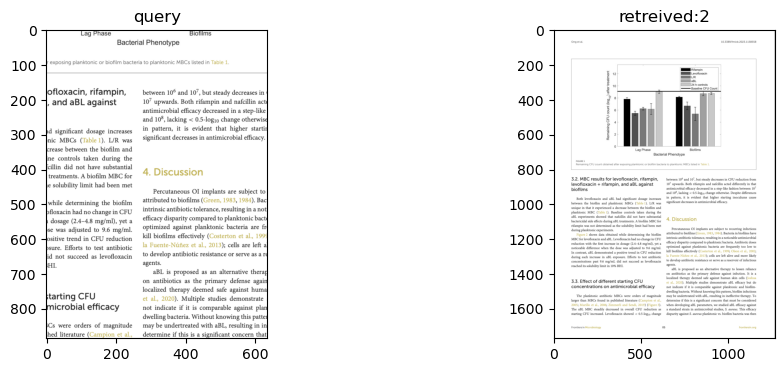

In [19]:
docs_path = './../../data/docs/'
query_imgs = []

for i in range(1,11):
    img_path = docs_path + str(i) + '.png'
    img = cv2.imread(img_path)
    img_c = random_quarter_crop(img)
    img_retr, doc_id, score = dv.query(img_c)
    plot_res(img_c,img_retr,doc_id)

found 300 query vectors
doc_id: 0 score: 4191.74
doc_id: 1 score: 4357.89
doc_id: 2 score: 1011.72
doc_id: 3 score: 1417.33
doc_id: 4 score: 4301.69
doc_id: 5 score: 2424.91
doc_id: 6 score: 4169.57
doc_id: 7 score: 3926.6
doc_id: 8 score: 4100.62
doc_id: 9 score: 4374.33


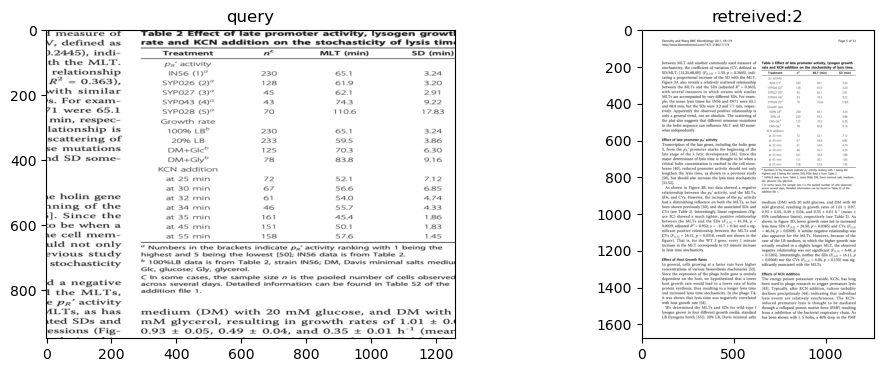

found 307 query vectors
doc_id: 0 score: 3799.14
doc_id: 1 score: 3974.18
doc_id: 2 score: 989.91
doc_id: 3 score: 1528.72
doc_id: 4 score: 3878.67
doc_id: 5 score: 2554.24
doc_id: 6 score: 3824.5
doc_id: 7 score: 3489.35
doc_id: 8 score: 3795.95
doc_id: 9 score: 3959.45


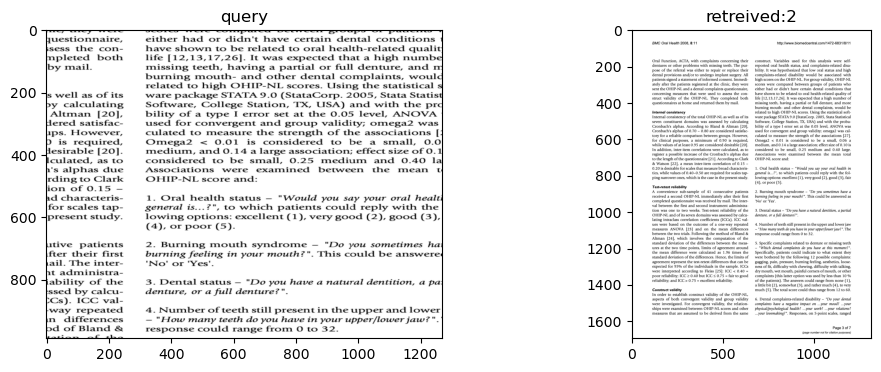

found 397 query vectors
doc_id: 0 score: 8553.83
doc_id: 1 score: 8889.05
doc_id: 2 score: 1076.84
doc_id: 3 score: 1581.08
doc_id: 4 score: 8660.49
doc_id: 5 score: 2540.29
doc_id: 6 score: 8494.3
doc_id: 7 score: 8015.08
doc_id: 8 score: 8208.6
doc_id: 9 score: 8829.91


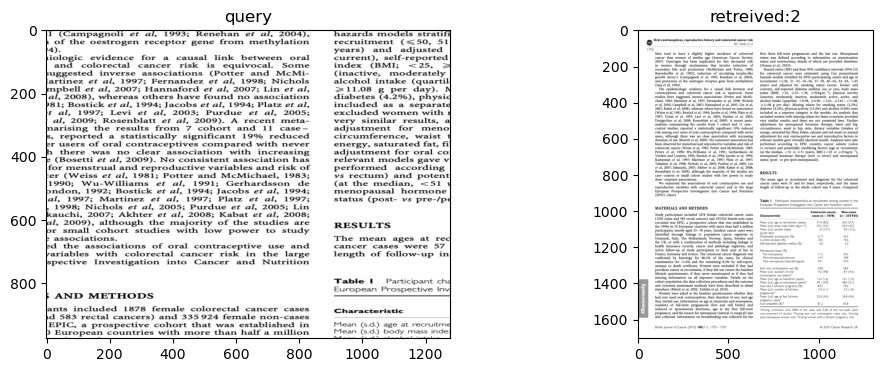

found 43 query vectors
doc_id: 0 score: 1566.38
doc_id: 1 score: 1571.59
doc_id: 2 score: 1561.06
doc_id: 3 score: 1592.31
doc_id: 4 score: 1652.07
doc_id: 5 score: 1602.79
doc_id: 6 score: 1629.85
doc_id: 7 score: 1650.96
doc_id: 8 score: 1518.64
doc_id: 9 score: 1631.43


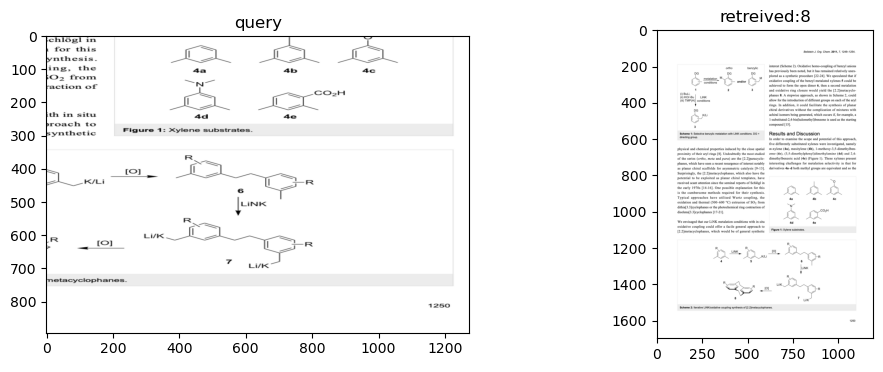

found 441 query vectors
doc_id: 0 score: 8469.49
doc_id: 1 score: 1452.83
doc_id: 2 score: 1042.53
doc_id: 3 score: 1567.04
doc_id: 4 score: 8603.32
doc_id: 5 score: 2516.48
doc_id: 6 score: 8423.98
doc_id: 7 score: 7999.65
doc_id: 8 score: 8386.05
doc_id: 9 score: 1350.93


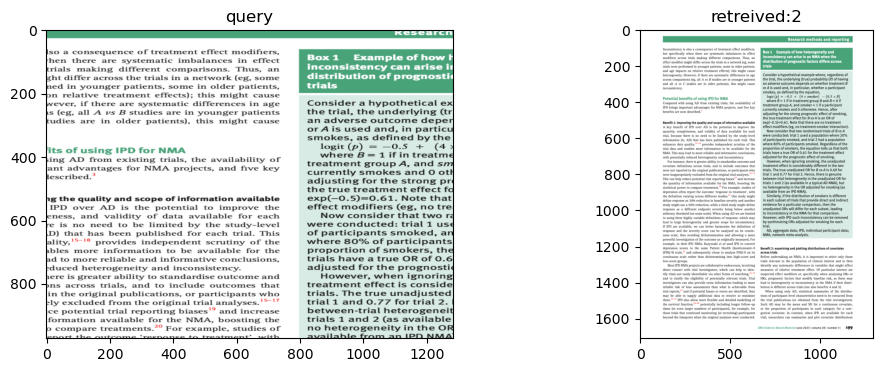

found 366 query vectors
doc_id: 0 score: 7542.91
doc_id: 1 score: 7755.19
doc_id: 2 score: 1053.41
doc_id: 3 score: 1481.27
doc_id: 4 score: 7701.52
doc_id: 5 score: 2440.36
doc_id: 6 score: 7556.79
doc_id: 7 score: 7117.91
doc_id: 8 score: 7015.38
doc_id: 9 score: 7803.11


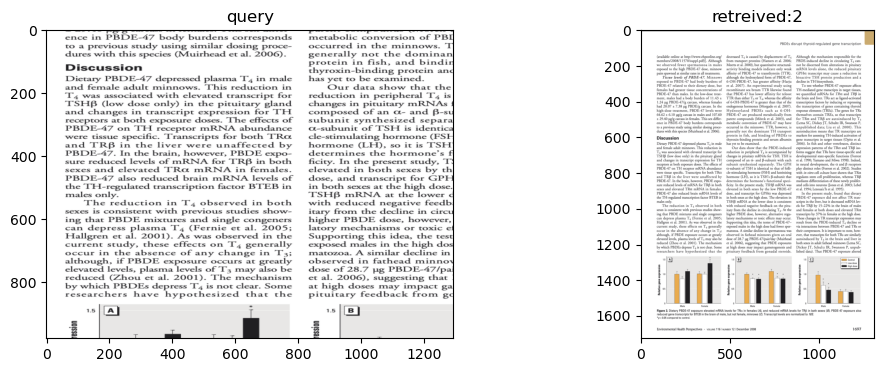

found 213 query vectors
doc_id: 0 score: 4023.62
doc_id: 1 score: 4216.88
doc_id: 2 score: 4069.18
doc_id: 3 score: 1674.82
doc_id: 4 score: 4118.73
doc_id: 5 score: 2600.72
doc_id: 6 score: 4001.26
doc_id: 7 score: 3862.7
doc_id: 8 score: 3986.4
doc_id: 9 score: 4146.82


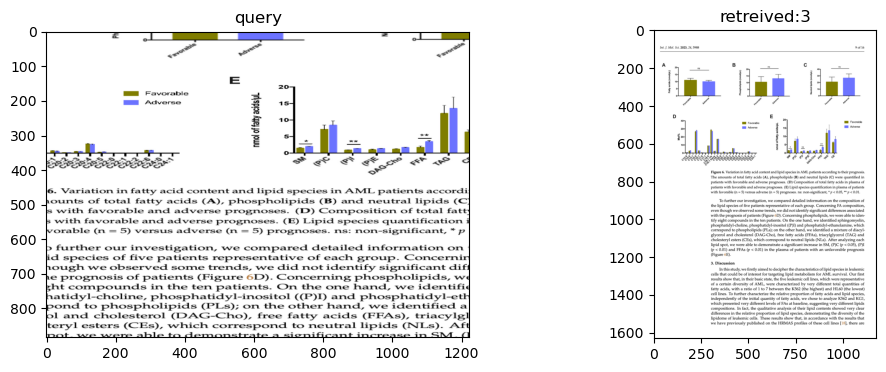

found 233 query vectors
doc_id: 0 score: 4796.92
doc_id: 1 score: 4986.72
doc_id: 2 score: 4556.42
doc_id: 3 score: 1400.99
doc_id: 4 score: 5011.96
doc_id: 5 score: 2475.79
doc_id: 6 score: 4904.59
doc_id: 7 score: 4698.56
doc_id: 8 score: 4560.33
doc_id: 9 score: 5050.09


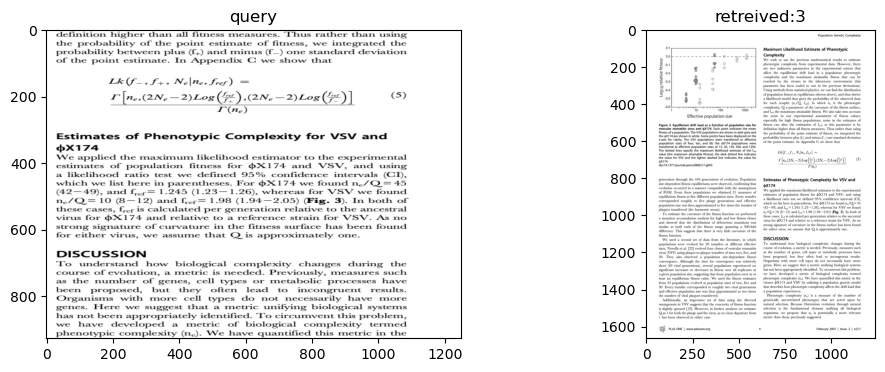

found 493 query vectors
doc_id: 0 score: 1866.84
doc_id: 1 score: 1234.53
doc_id: 2 score: 923.91
doc_id: 3 score: 1492.06
doc_id: 4 score: 6602.6
doc_id: 5 score: 2540.41
doc_id: 6 score: 3385.26
doc_id: 7 score: 5910.79
doc_id: 8 score: 6422.13
doc_id: 9 score: 1145.75


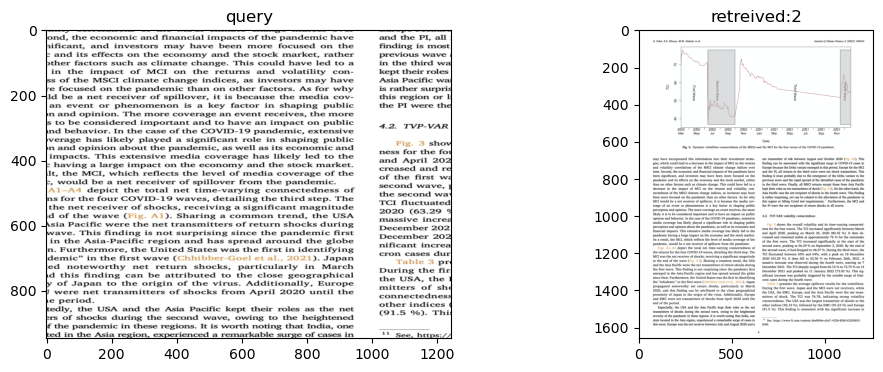

found 149 query vectors
doc_id: 0 score: 9057.44
doc_id: 1 score: 9443.98
doc_id: 2 score: 9098.78
doc_id: 3 score: 8828.91
doc_id: 4 score: 9874.44
doc_id: 5 score: 8851.5
doc_id: 6 score: 8217.9
doc_id: 7 score: 9747.09
doc_id: 8 score: 9363.88
doc_id: 9 score: 9772.79


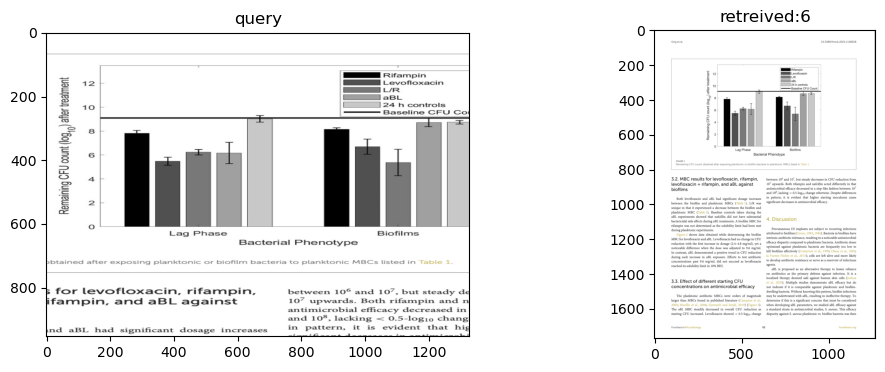

In [20]:
docs_path = './../../data/docs/'
query_imgs = []
k = 1.5

for i in range(1,11):
    img_path = docs_path + str(i) + '.png'
    img = cv2.imread(img_path)
    img_c = random_quarter_crop(img)
    
    dimension = int(k*img_c.shape[0]),int(k*img_c.shape[1])
    img_cc = cv2.resize(img_c, dimension, interpolation=cv2.INTER_AREA)
    img_retr, doc_id, score = dv.query(img_cc)
    plot_res(img_cc,img_retr,doc_id)

found 3497 query vectors
doc_id: 0 score: 2188.12
doc_id: 1 score: 1857.97
doc_id: 2 score: 1230.88
doc_id: 3 score: 1480.28
doc_id: 4 score: 2102.64
doc_id: 5 score: 2363.0
doc_id: 6 score: 3284.36
doc_id: 7 score: 2070.12
doc_id: 8 score: 2639.56
doc_id: 9 score: 1686.28


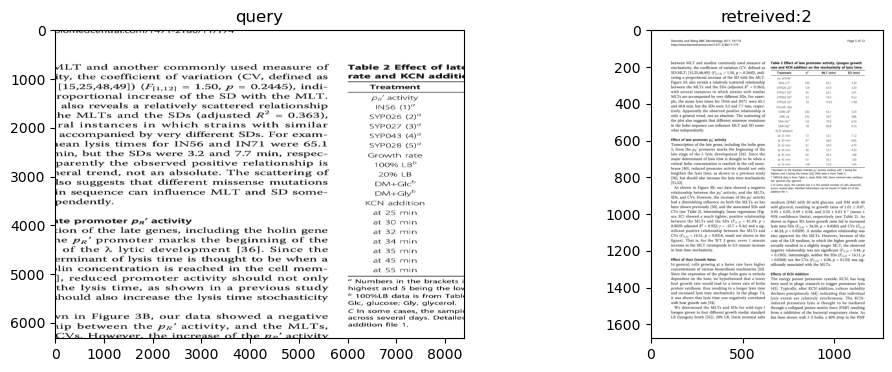

found 2405 query vectors
doc_id: 0 score: 2200.73
doc_id: 1 score: 1926.23
doc_id: 2 score: 1275.57
doc_id: 3 score: 1382.34
doc_id: 4 score: 2225.93
doc_id: 5 score: 2144.29
doc_id: 6 score: 3037.03
doc_id: 7 score: 2163.39
doc_id: 8 score: 2788.93
doc_id: 9 score: 1796.79


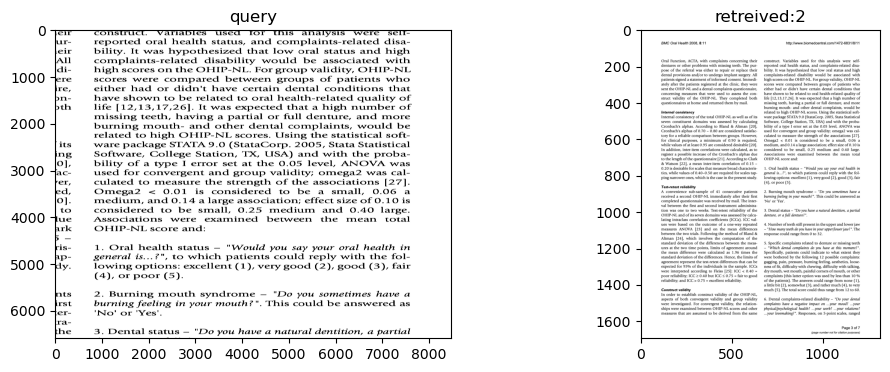

found 4508 query vectors
doc_id: 0 score: 2158.38
doc_id: 1 score: 1810.37
doc_id: 2 score: 1211.62
doc_id: 3 score: 1534.18
doc_id: 4 score: 2048.54
doc_id: 5 score: 2221.87
doc_id: 6 score: 3050.62
doc_id: 7 score: 2014.24
doc_id: 8 score: 2666.4
doc_id: 9 score: 1671.85


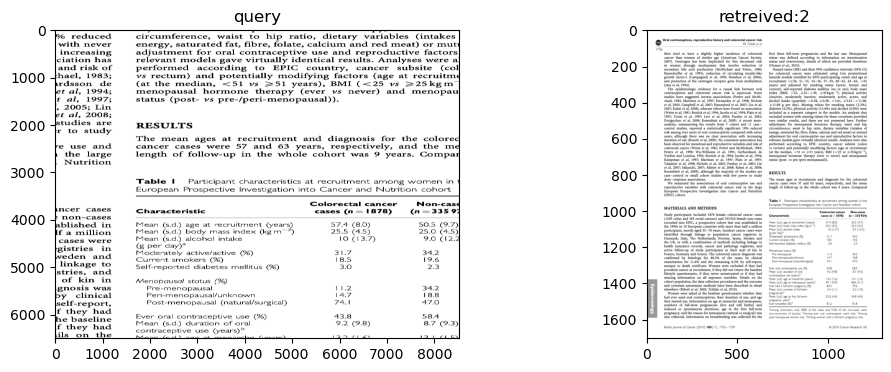

found 2742 query vectors
doc_id: 0 score: 2135.09
doc_id: 1 score: 1734.68
doc_id: 2 score: 1160.38
doc_id: 3 score: 1475.88
doc_id: 4 score: 1929.2
doc_id: 5 score: 2194.18
doc_id: 6 score: 3138.22
doc_id: 7 score: 1925.06
doc_id: 8 score: 2587.48
doc_id: 9 score: 1573.41


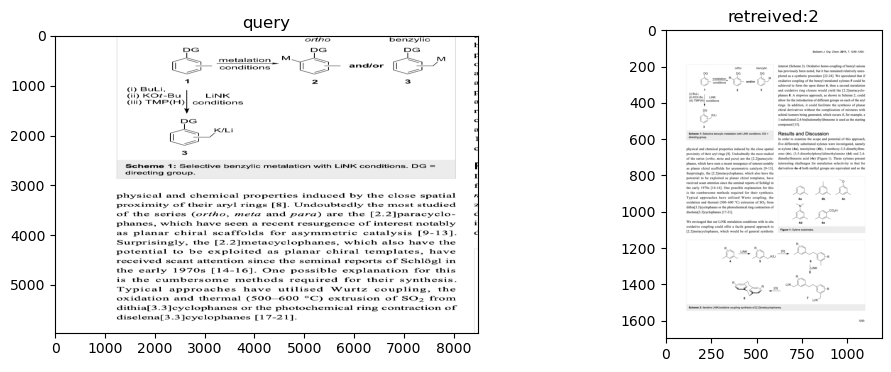

found 3420 query vectors
doc_id: 0 score: 2142.39
doc_id: 1 score: 1855.51
doc_id: 2 score: 1226.87
doc_id: 3 score: 1532.52
doc_id: 4 score: 2100.4
doc_id: 5 score: 2245.49
doc_id: 6 score: 3270.27
doc_id: 7 score: 2063.65
doc_id: 8 score: 2687.92
doc_id: 9 score: 1679.15


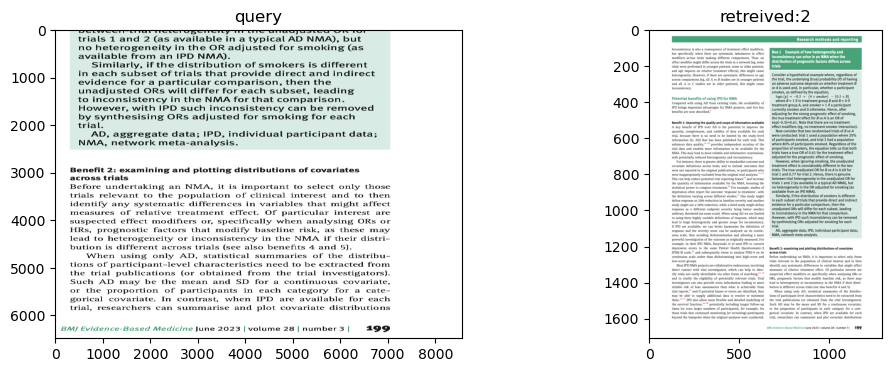

found 5774 query vectors
doc_id: 0 score: 2212.75
doc_id: 1 score: 1956.86
doc_id: 2 score: 1282.54
doc_id: 3 score: 1446.85
doc_id: 4 score: 2210.85
doc_id: 5 score: 2342.61
doc_id: 6 score: 3101.63
doc_id: 7 score: 2183.44
doc_id: 8 score: 2711.03
doc_id: 9 score: 1776.62


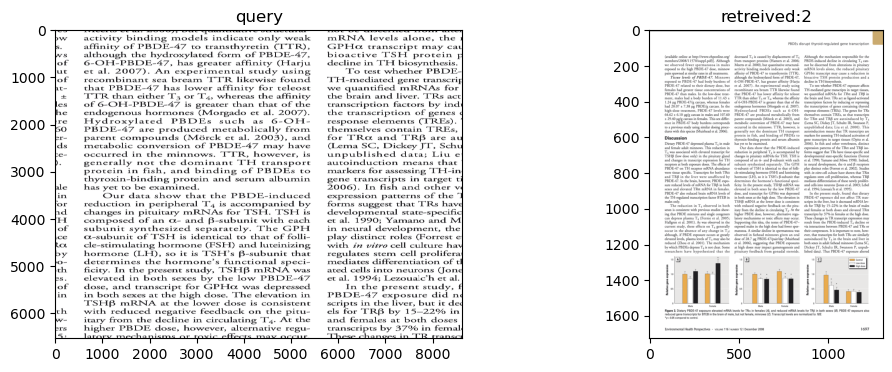

found 2731 query vectors
doc_id: 0 score: 2170.57
doc_id: 1 score: 1830.65
doc_id: 2 score: 1216.26
doc_id: 3 score: 1446.09
doc_id: 4 score: 2039.89
doc_id: 5 score: 1930.28
doc_id: 6 score: 3170.8
doc_id: 7 score: 2013.19
doc_id: 8 score: 2617.98
doc_id: 9 score: 1663.22


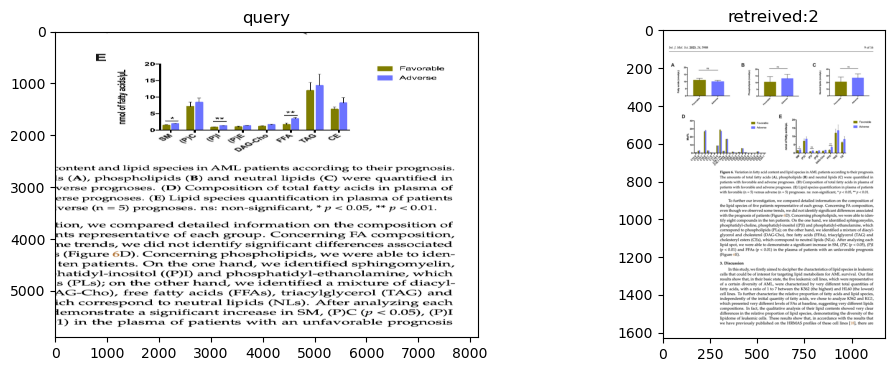

found 6084 query vectors
doc_id: 0 score: 2304.85
doc_id: 1 score: 1972.82
doc_id: 2 score: 1292.02
doc_id: 3 score: 1650.37
doc_id: 4 score: 2277.54
doc_id: 5 score: 2480.87
doc_id: 6 score: 3637.07
doc_id: 7 score: 2223.55
doc_id: 8 score: 2825.86
doc_id: 9 score: 1811.35


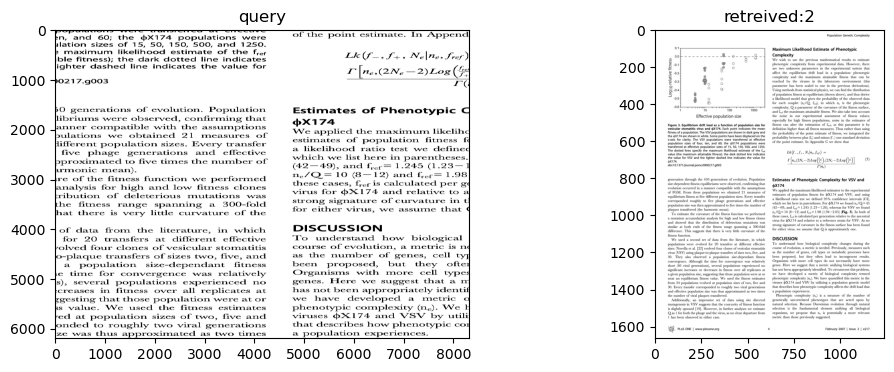

found 4734 query vectors
doc_id: 0 score: 2352.45
doc_id: 1 score: 2001.98
doc_id: 2 score: 1307.8
doc_id: 3 score: 1601.03
doc_id: 4 score: 2266.28
doc_id: 5 score: 2420.36
doc_id: 6 score: 3438.99
doc_id: 7 score: 2222.42
doc_id: 8 score: 2815.65
doc_id: 9 score: 1834.78


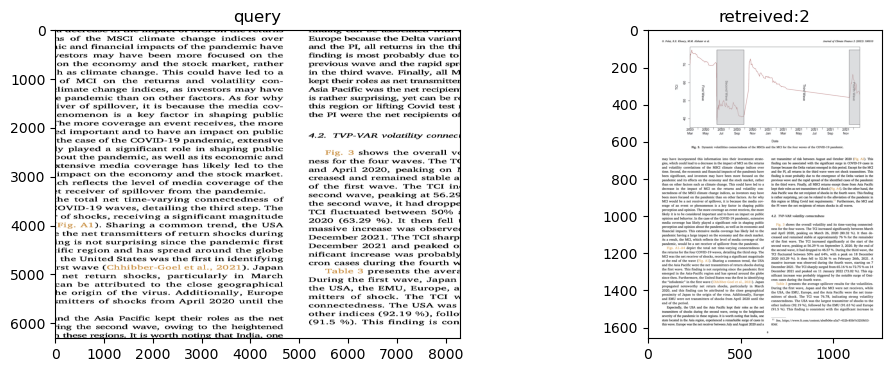

found 2328 query vectors
doc_id: 0 score: 2098.31
doc_id: 1 score: 1755.44
doc_id: 2 score: 1197.14
doc_id: 3 score: 1427.72
doc_id: 4 score: 1942.34
doc_id: 5 score: 2259.88
doc_id: 6 score: 3105.87
doc_id: 7 score: 1915.42
doc_id: 8 score: 2590.85
doc_id: 9 score: 1576.63


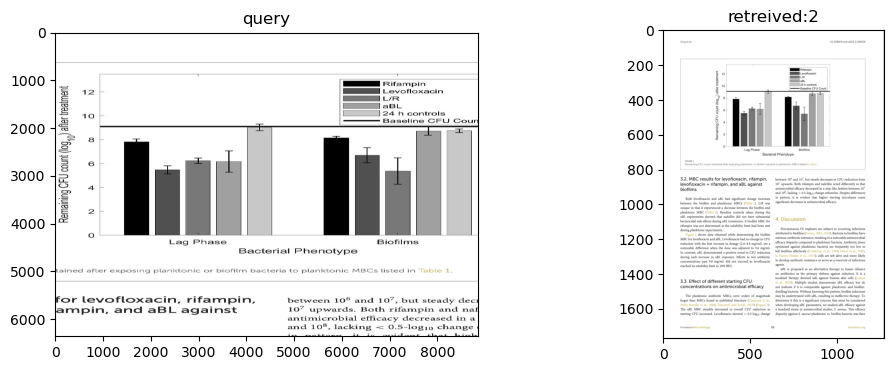

In [21]:
docs_path = './../../data/docs/'
query_imgs = []
k = 10

for i in range(1,11):
    img_path = docs_path + str(i) + '.png'
    img = cv2.imread(img_path)
    img_c = random_quarter_crop(img)
    
    dimension = int(k*img_c.shape[0]),int(k*img_c.shape[1])
    img_cc = cv2.resize(img_c, dimension, interpolation=cv2.INTER_AREA)
    img_retr, doc_id, score = dv.query(img_cc)
    plot_res(img_cc,img_retr,doc_id)

found 0 query vectors
doc_id: 0 score: 0.0
doc_id: 1 score: 0.0
doc_id: 2 score: 0.0
doc_id: 3 score: 0.0
doc_id: 4 score: 0.0
doc_id: 5 score: 0.0
doc_id: 6 score: 0.0
doc_id: 7 score: 0.0
doc_id: 8 score: 0.0
doc_id: 9 score: 0.0


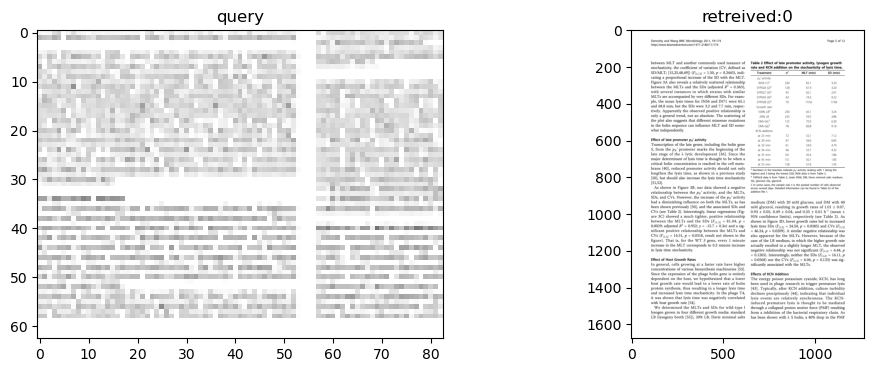


found 0 query vectors
doc_id: 0 score: 0.0
doc_id: 1 score: 0.0
doc_id: 2 score: 0.0
doc_id: 3 score: 0.0
doc_id: 4 score: 0.0
doc_id: 5 score: 0.0
doc_id: 6 score: 0.0
doc_id: 7 score: 0.0
doc_id: 8 score: 0.0
doc_id: 9 score: 0.0


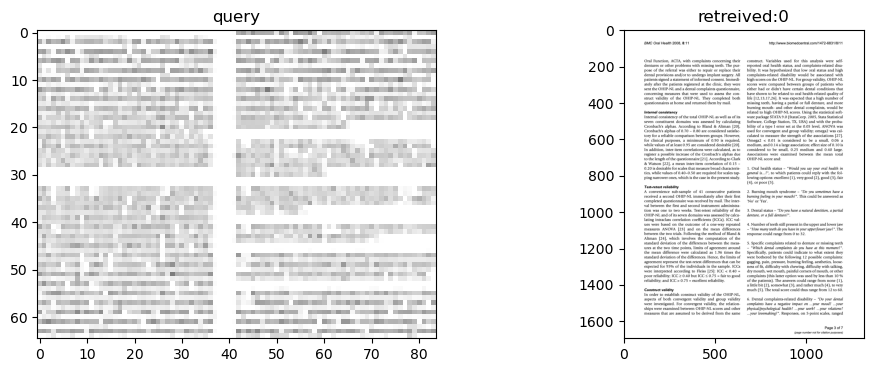

found 0 query vectors
doc_id: 0 score: 0.0
doc_id: 1 score: 0.0
doc_id: 2 score: 0.0
doc_id: 3 score: 0.0
doc_id: 4 score: 0.0
doc_id: 5 score: 0.0
doc_id: 6 score: 0.0
doc_id: 7 score: 0.0
doc_id: 8 score: 0.0
doc_id: 9 score: 0.0


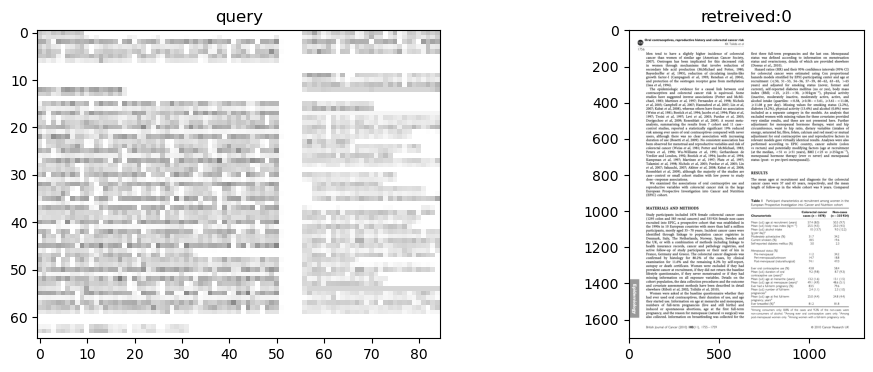


found 0 query vectors
doc_id: 0 score: 0.0
doc_id: 1 score: 0.0
doc_id: 2 score: 0.0
doc_id: 3 score: 0.0
doc_id: 4 score: 0.0
doc_id: 5 score: 0.0
doc_id: 6 score: 0.0
doc_id: 7 score: 0.0
doc_id: 8 score: 0.0
doc_id: 9 score: 0.0


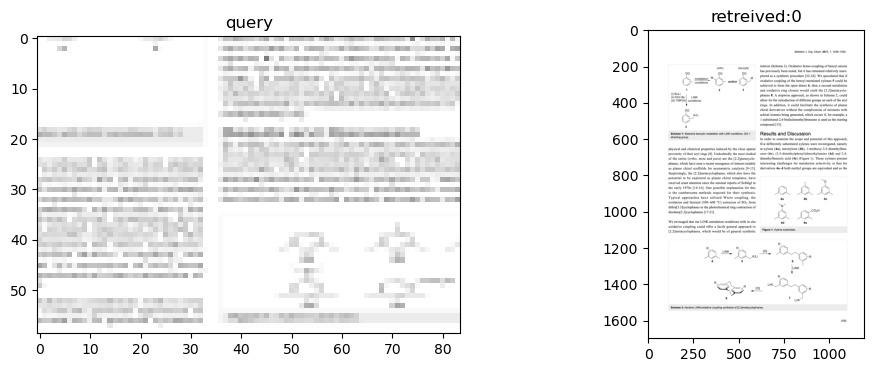

KeyError: 0

In [23]:
docs_path = './../../data/docs/'
query_imgs = []
k = 0.1

for i in range(1,11):
    img_path = docs_path + str(i) + '.png'
    img = cv2.imread(img_path)
    img_c = random_quarter_crop(img)
    
    dimension = int(k*img_c.shape[0]),int(k*img_c.shape[1])
    img_cc = cv2.resize(img_c, dimension, interpolation=cv2.INTER_AREA)
    img_retr, doc_id, score = dv.query(img_cc)
    plot_res(img_cc,img_retr,doc_id)

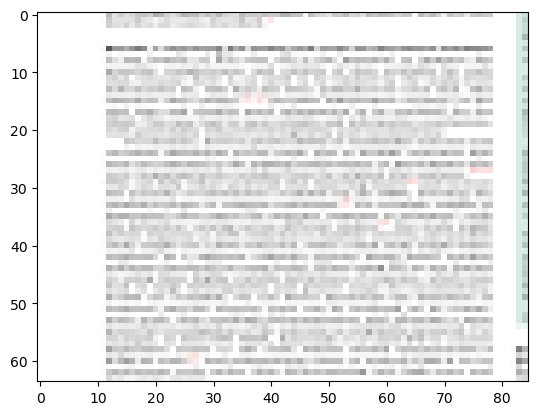

In [24]:
plt.imshow(img_cc)

In [25]:
docs_path = './../../data/docs/'
query_imgs = []
k = 0.25

for i in range(1,11):
    img_path = docs_path + str(i) + '.png'
    img = cv2.imread(img_path)
    img_c = random_quarter_crop(img)
    
    dimension = int(k*img_c.shape[0]),int(k*img_c.shape[1])
    img_cc = cv2.resize(img_c, dimension, interpolation=cv2.INTER_AREA)
    img_retr, doc_id, score = dv.query(img_cc)
    plot_res(img_cc,img_retr,doc_id)

KeyError: 0

## random crop(15%)

In [26]:
def random_percentage_crop(img, percentage=15):
    img_height, img_width, _ = img.shape
    crop_area = (img_width * img_height * percentage) / 100
    crop_width = int(np.sqrt(crop_area * (img_width / img_height)))
    crop_height = int(np.sqrt(crop_area * (img_height / img_width)))
    max_left = img_width - crop_width
    max_top = img_height - crop_height
    left = random.randint(0, max_left)
    top = random.randint(0, max_top)
    cropped_img = img[top:top + crop_height, left:left + crop_width]
    return cropped_img

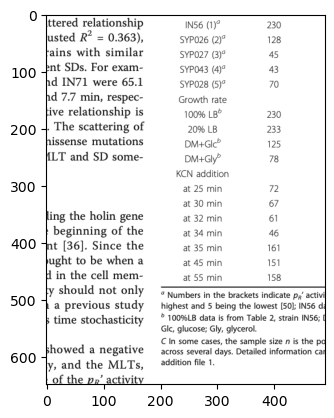

In [27]:
img_path = docs_path + str(1) + '.png'
img = cv2.imread(img_path)
img_c = random_percentage_crop(img)
plt.imshow(img_c)

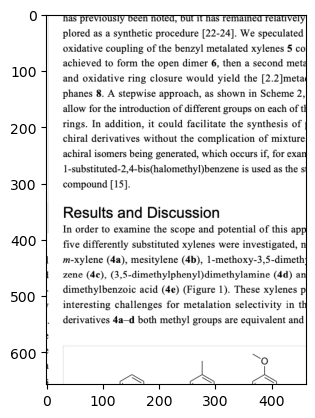

In [28]:
img_path = docs_path + str(4) + '.png'
img = cv2.imread(img_path)
img_c = random_percentage_crop(img)
plt.imshow(img_c)

## rotate_derotate

In [29]:
def rotate_derotate(img):
    height, width = img.shape[:2]
    angle = random.randint(-90, 90)
    rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
    rotated_image = cv2.warpAffine(img, rotation_matrix, (width, height))
    derotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), -angle, 1)
    derotated_image = cv2.warpAffine(rotated_image, derotation_matrix, (width, height))
    return derotated_image

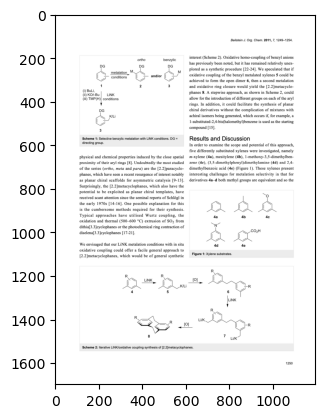

In [30]:
plt.imshow(img)

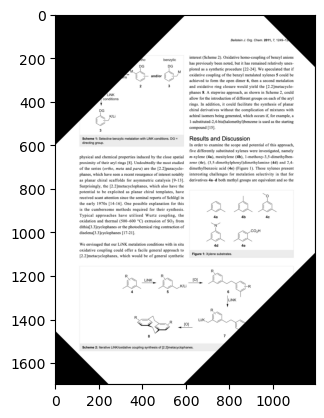

In [31]:
plt.imshow(rotate_derotate(img))

found 89 query vectors
doc_id: 0 score: 2197.53
doc_id: 1 score: 2300.1
doc_id: 2 score: 2135.64
doc_id: 3 score: 2357.56
doc_id: 4 score: 2356.43
doc_id: 5 score: 2323.97
doc_id: 6 score: 2220.68
doc_id: 7 score: 2257.17
doc_id: 8 score: 2176.84
doc_id: 9 score: 2360.92


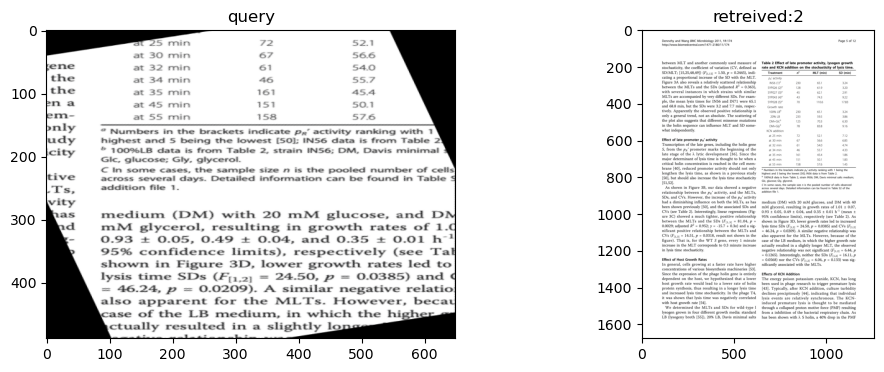

found 80 query vectors
doc_id: 0 score: 2747.7
doc_id: 1 score: 2866.2
doc_id: 2 score: 2638.27
doc_id: 3 score: 2824.39
doc_id: 4 score: 2891.65
doc_id: 5 score: 2862.92
doc_id: 6 score: 2804.53
doc_id: 7 score: 2796.41
doc_id: 8 score: 2683.0
doc_id: 9 score: 2904.53


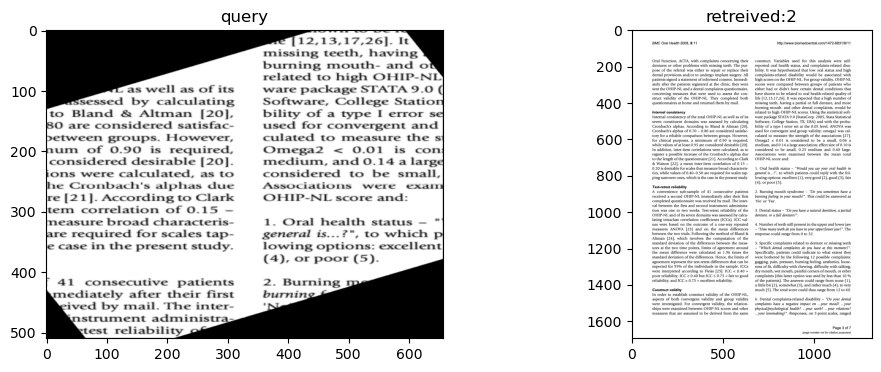

found 61 query vectors
doc_id: 0 score: 5463.61
doc_id: 1 score: 5737.48
doc_id: 2 score: 5397.25
doc_id: 3 score: 5587.43
doc_id: 4 score: 6012.61
doc_id: 5 score: 5550.4
doc_id: 6 score: 5166.83
doc_id: 7 score: 5954.81
doc_id: 8 score: 5597.47
doc_id: 9 score: 5929.17


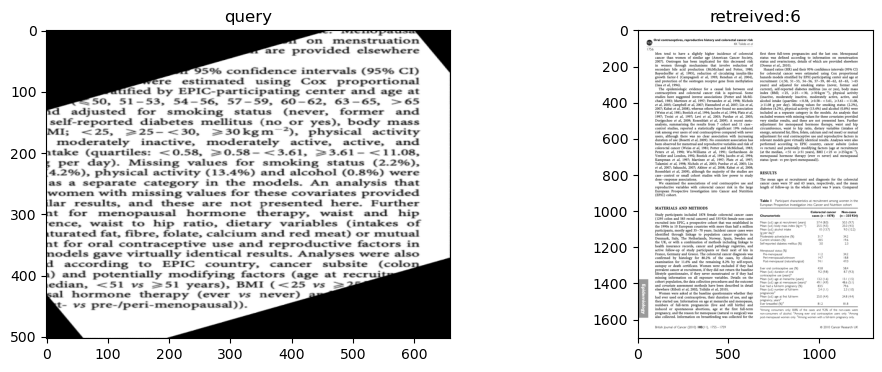

found 36 query vectors
doc_id: 0 score: 640.88
doc_id: 1 score: 652.25
doc_id: 2 score: 667.76
doc_id: 3 score: 652.98
doc_id: 4 score: 657.41
doc_id: 5 score: 651.15
doc_id: 6 score: 600.23
doc_id: 7 score: 650.55
doc_id: 8 score: 616.54
doc_id: 9 score: 647.19


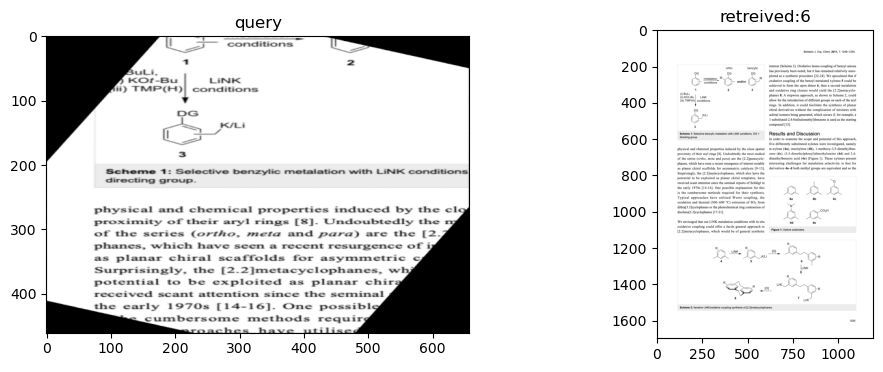

found 82 query vectors
doc_id: 0 score: 3716.56
doc_id: 1 score: 3842.0
doc_id: 2 score: 3548.18
doc_id: 3 score: 3841.48
doc_id: 4 score: 3987.0
doc_id: 5 score: 3708.23
doc_id: 6 score: 3689.63
doc_id: 7 score: 3881.15
doc_id: 8 score: 3595.92
doc_id: 9 score: 3873.54


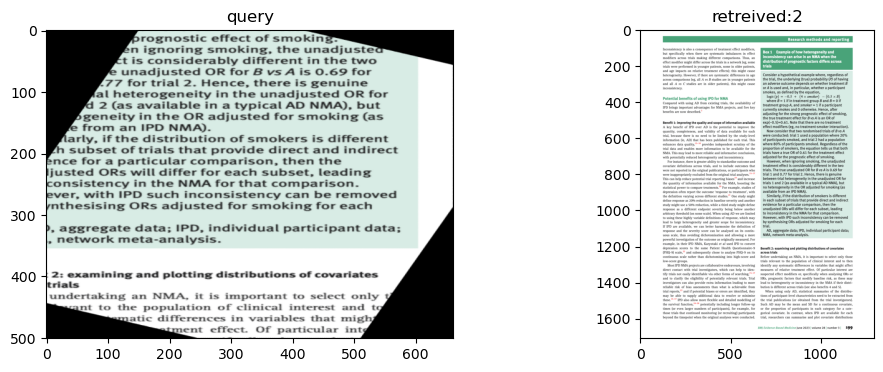

found 16 query vectors
doc_id: 0 score: 953.55
doc_id: 1 score: 1050.94
doc_id: 2 score: 999.79
doc_id: 3 score: 1128.7
doc_id: 4 score: 1188.94
doc_id: 5 score: 1074.8
doc_id: 6 score: 1016.92
doc_id: 7 score: 1193.18
doc_id: 8 score: 1087.99
doc_id: 9 score: 1154.75


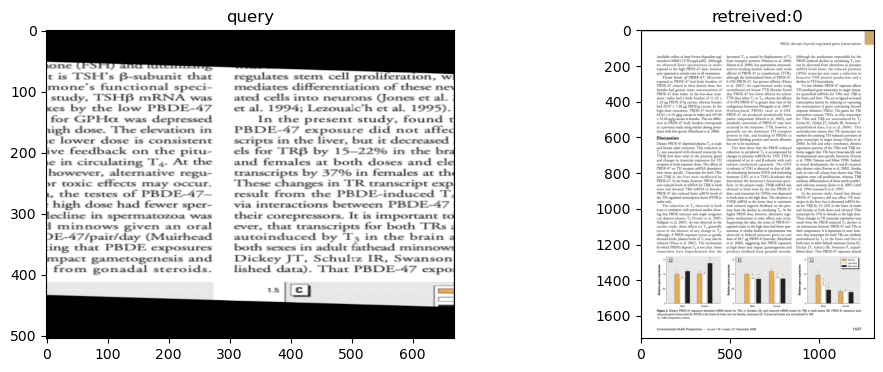

found 39 query vectors
doc_id: 0 score: 1594.06
doc_id: 1 score: 1709.39
doc_id: 2 score: 1649.14
doc_id: 3 score: 1566.12
doc_id: 4 score: 1820.63
doc_id: 5 score: 1755.48
doc_id: 6 score: 1640.74
doc_id: 7 score: 1806.09
doc_id: 8 score: 1684.14
doc_id: 9 score: 1781.3


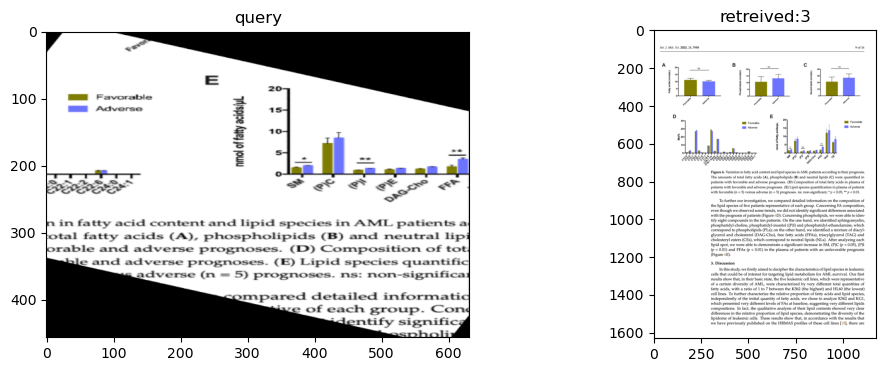

found 28 query vectors
doc_id: 0 score: 247.89
doc_id: 1 score: 266.79
doc_id: 2 score: 270.3
doc_id: 3 score: 267.85
doc_id: 4 score: 262.14
doc_id: 5 score: 266.67
doc_id: 6 score: 260.93
doc_id: 7 score: 250.86
doc_id: 8 score: 245.59
doc_id: 9 score: 255.88


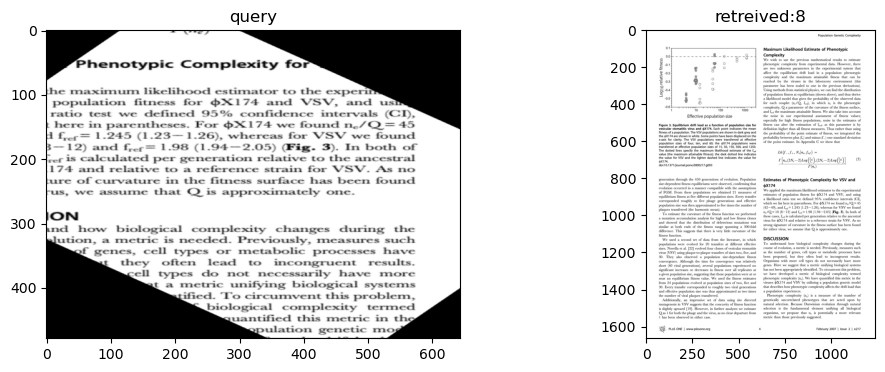

found 34 query vectors
doc_id: 0 score: 924.21
doc_id: 1 score: 959.41
doc_id: 2 score: 939.26
doc_id: 3 score: 893.37
doc_id: 4 score: 978.85
doc_id: 5 score: 954.03
doc_id: 6 score: 723.14
doc_id: 7 score: 964.19
doc_id: 8 score: 877.66
doc_id: 9 score: 979.63


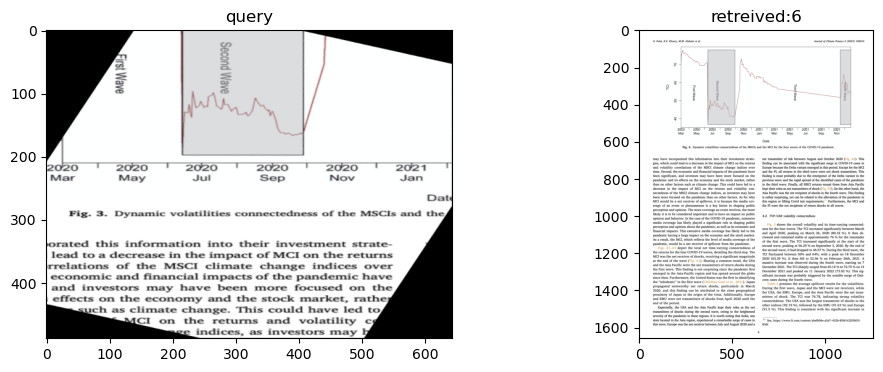

found 70 query vectors
doc_id: 0 score: 2146.7
doc_id: 1 score: 2169.55
doc_id: 2 score: 1949.1
doc_id: 3 score: 2189.92
doc_id: 4 score: 2193.97
doc_id: 5 score: 2153.93
doc_id: 6 score: 2135.25
doc_id: 7 score: 2093.05
doc_id: 8 score: 1858.5
doc_id: 9 score: 2210.82


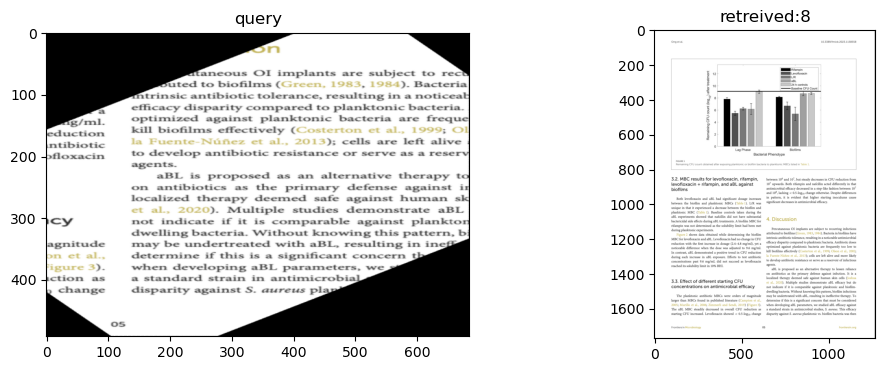

In [32]:
docs_path = './../../data/docs/'
query_imgs = []
k = 1

for i in range(1,11):
    img_path = docs_path + str(i) + '.png'
    img = cv2.imread(img_path)
    img_c = random_percentage_crop(img)
    img_c = rotate_derotate(img_c)
    
    dimension = int(k*img_c.shape[0]),int(k*img_c.shape[1])
    img_cc = cv2.resize(img_c, dimension, interpolation=cv2.INTER_AREA)
    img_retr, doc_id, score = dv.query(img_cc)
    plot_res(img_cc,img_retr,doc_id)

## camera capture

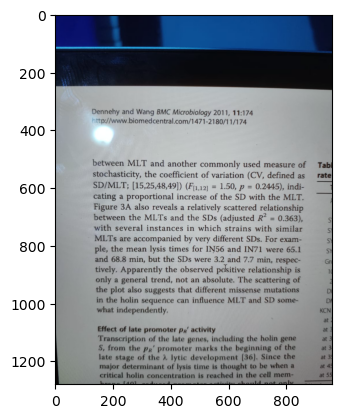

In [33]:
q1 = cv2.imread("./../../data/queries/1.jpeg")
plt.imshow(q1)

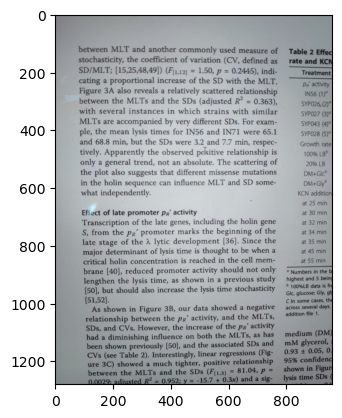

In [34]:
q2 = cv2.imread("./../../data/queries/2.jpeg")
plt.imshow(q2)

found 772 query vectors
doc_id: 0 score: 2042.58
doc_id: 1 score: 1622.47
doc_id: 2 score: 1113.76
doc_id: 3 score: 1509.17
doc_id: 4 score: 1747.23
doc_id: 5 score: 2181.66
doc_id: 6 score: 3015.52
doc_id: 7 score: 1729.88
doc_id: 8 score: 2577.14
doc_id: 9 score: 1432.9


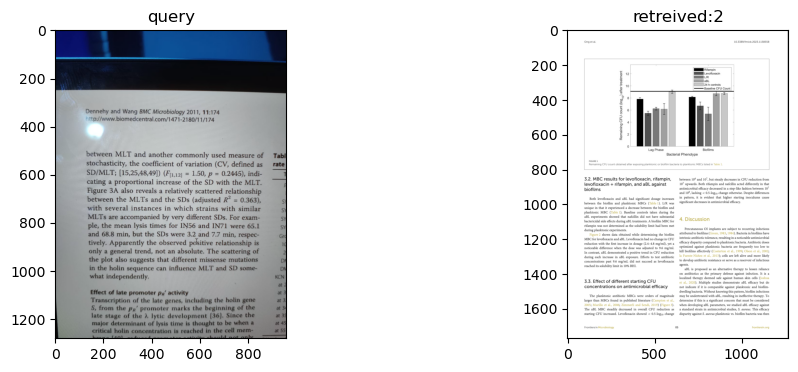

In [35]:
img_retr, doc_id, score = dv.query(q1)
plot_res(q1,img_retr,doc_id)

found 722 query vectors
doc_id: 0 score: 2225.55
doc_id: 1 score: 1715.63
doc_id: 2 score: 1164.35
doc_id: 3 score: 1521.47
doc_id: 4 score: 1885.55
doc_id: 5 score: 2504.91
doc_id: 6 score: 3335.99
doc_id: 7 score: 1864.82
doc_id: 8 score: 2746.89
doc_id: 9 score: 1538.75


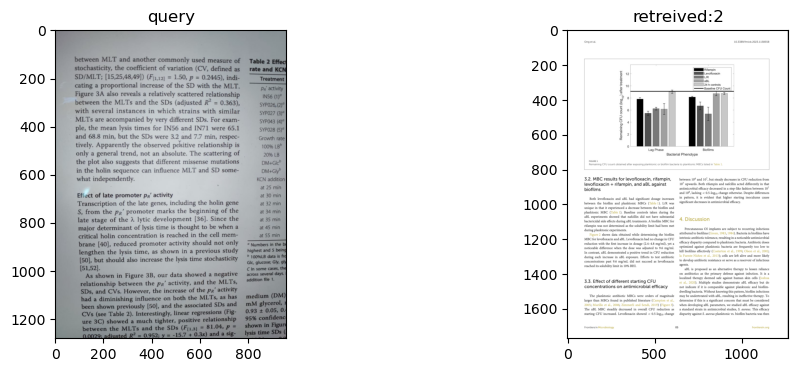

In [36]:
img_retr, doc_id, score = dv.query(q2)
plot_res(q2,img_retr,doc_id)

## camera capture- enhanced-camscanner

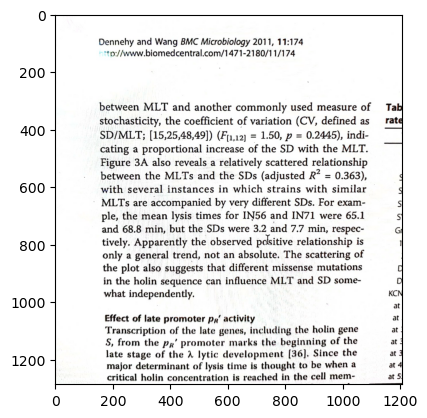

In [37]:
q11 = cv2.imread("./../../data/queries/1_CS.jpeg")
plt.imshow(q11)

found 269 query vectors
doc_id: 0 score: 11364.12
doc_id: 1 score: 12241.85
doc_id: 2 score: 1339.82
doc_id: 3 score: 1606.39
doc_id: 4 score: 12647.51
doc_id: 5 score: 2295.89
doc_id: 6 score: 11110.72
doc_id: 7 score: 12485.25
doc_id: 8 score: 11567.72
doc_id: 9 score: 12702.32


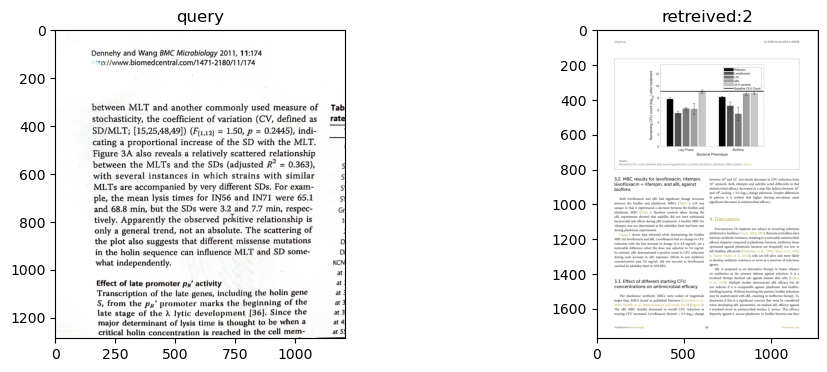

In [38]:
img_retr, doc_id, score = dv.query(q11)
plot_res(q11,img_retr,doc_id)

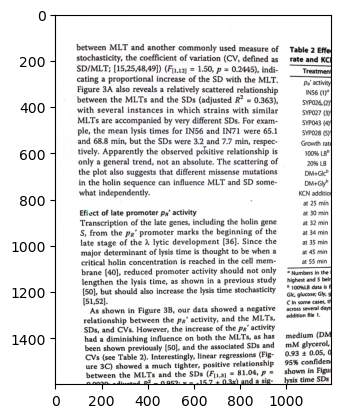

In [39]:
q2 = cv2.imread("./../../data/queries/2_CS.jpeg")
plt.imshow(q2)

found 362 query vectors
doc_id: 0 score: 25853.44
doc_id: 1 score: 25954.18
doc_id: 2 score: 1267.55
doc_id: 3 score: 1519.46
doc_id: 4 score: 27236.93
doc_id: 5 score: 2129.52
doc_id: 6 score: 25203.2
doc_id: 7 score: 26631.28
doc_id: 8 score: 23849.73
doc_id: 9 score: 27191.35


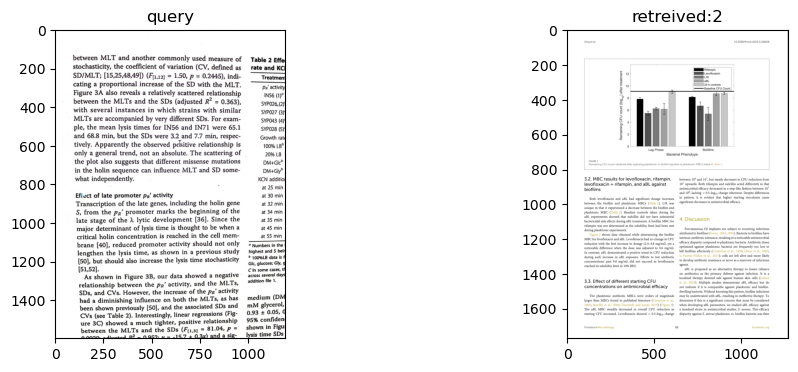

In [40]:
img_retr, doc_id, score = dv.query(q2)
plot_res(q2,img_retr,doc_id)

## camera capture- enhanced-cv2

In [41]:
def cv2_enhance(img):
    img = cv2.resize(img, (int(480*2), int(640*2)))
    w, h = 480, 640
    imgWarp = img.copy()

    # detect frame
    GrayImg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    BlurredFrame = cv2.GaussianBlur(GrayImg, (5, 5), 1)
    CannyFrame = cv2.Canny(BlurredFrame, 190, 190)
    contours, _ = cv2.findContours(CannyFrame, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ContourFrame = img.copy()
    ContourFrame = cv2.drawContours(ContourFrame, contours, -1, (255, 0, 255), 4)

    CornerFrame = img.copy()
    maxArea = 0
    biggest = []
    for i in contours :
        area = cv2.contourArea(i)
        if area > 500 :
            peri = cv2.arcLength(i, True)
            edges = cv2.approxPolyDP(i, 0.02*peri, True)
            if area > maxArea and len(edges) == 4 :
                biggest = edges
                maxArea = area
    if len(biggest) != 0 :
       # drawRec(biggest, CornerFrame)
        biggest = biggest.reshape((4, 2))
        biggestNew = np.zeros((4, 1, 2), dtype= np.int32)
        add = biggest.sum(1)
        biggestNew[0] = biggest[np.argmin(add)]
        biggestNew[3] = biggest[np.argmax(add)]
        dif = np.diff(biggest, axis = 1)
        biggestNew[1] = biggest[np.argmin(dif)]
        biggestNew[2] = biggest[np.argmax(dif)]
        drawRec(biggestNew, CornerFrame)
        CornerFrame = cv2.drawContours(CornerFrame, biggestNew, -1, (255, 0, 255), 25)
        pts1 = np.float32(biggestNew)
        pts2 = np.float32([[0, 0], [w, 0], [0, h], [w, h]])
        matrix = cv2.getPerspectiveTransform(pts1, pts2)
        imgWarp = cv2.warpPerspective(img, matrix, (w, h))
    return imgWarp

In [42]:
q11 = cv2_enhance(q1)
q11.shape

(1280, 960, 3)

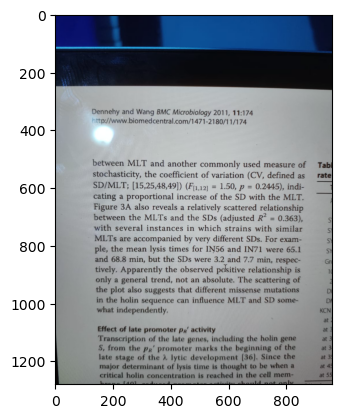

In [43]:
plt.imshow(q11)